### Data Notebook: Photostim Neural Dynamics

In [16]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 200
import matplotlib.colors as colors
import torch
import torch.nn as nn
import torch.optim as optim
import copy

# Load Data

In [2]:
# trial data
data = np.load('sample_photostim_0113.npy', allow_pickle = True).item()
y = data['y']
u = data['u']
num_trials = y.shape[0]
num_steps = y.shape[1]
num_neurons = y.shape[2]
T_before = 4
T_after_start = 9
T_after_end = 13
y_before = np.mean(y[:,:T_before,:],axis = 1)
y_after = np.mean(y[:,T_after_start:T_after_end,:],axis = 1)

y_session = data['y_session']
u_session = data['u_session']
# missing_data = np.isnan(y_session)
# start_idx = np.outer(np.linspace(0,y_session.shape[0]-1,y_session.shape[0]),np.ones(y_session.shape[1])).astype(int)
# for t in range(y_session.shape[0]):
#     for i in range(y_session.shape[1]):
#         if missing_data[t,i]:
#             j = 0
#             while missing_data[t-j,i]:
#                 j += 1
#             start_idx[t,i] = t-j


# linear interpolation of data
y_session_interp = y_session.copy()
for i in range(y_session.shape[1]):
    nan_start = -1
    nan_stop = -1
    for j in range(y_session.shape[0]):
        if nan_start == -1 and np.isnan(y_session_interp[j,i]):
            nan_start = j - 1
        if nan_start != -1 and not np.isnan(y_session_interp[j,i]):
            nan_stop = j
        if nan_start != -1 and nan_stop != -1:
            slope = y_session_interp[nan_stop,i] - y_session_interp[nan_start,i]
            for k in range(nan_stop - nan_start - 1):
                y_session_interp[nan_start + k + 1,i] = slope*k/(nan_stop-nan_start-1) + y_session_interp[nan_start,i]
            nan_start = -1
            nan_stop = -1
            
y_session = y_session[4:,:]
u_session = u_session[4:,:]
y_session_interp = y_session_interp[4:,:]

test_frac = 0.2
T = y_session.shape[0]
y_train_full = y_session[0:int((1-test_frac)*T),:]
y_test_full = y_session[int((1-test_frac)*T):,:]
y_train_full_interp = y_session_interp[0:int((1-test_frac)*T),:]
y_test_full_interp = y_session_interp[int((1-test_frac)*T):,:]
u_train_full = u_session[0:int((1-test_frac)*T),:]
u_test_full = u_session[int((1-test_frac)*T):,:]
missing_train = np.isnan(y_train_full) 
missing_test = np.isnan(y_test_full) 

print('done loading data')

done loading data


# Train model on linearly interpolated data

In [30]:
class SigmoidModel(nn.Module):
    def __init__(self, dim):
        super(SigmoidModel, self).__init__()  
        self.B = nn.Linear(dim, dim, bias=False)
        self.c = nn.Parameter( torch.randn(dim)*0.01  )
        self.beta = nn.Parameter( torch.randn(dim)*0.01  )
        self.gamma = nn.Parameter( torch.ones(dim)*0.01  )

    def forward(self, x, a):
        #return self.beta + self.gamma * ( self.B(a + x) + self.c)
        return self.beta + self.gamma * torch.sigmoid( self.B(a + x) + self.c)
    
class SigmoidModel2(nn.Module):
    def __init__(self, dim):
        super(SigmoidModel2, self).__init__()
        self.A = nn.Linear(dim, dim, bias=False)  
        self.B = nn.Linear(dim, dim, bias=False)
        self.c = nn.Parameter( torch.randn(dim)  )
        self.alpha = nn.Parameter( torch.ones(dim)  )
        self.beta = nn.Parameter( torch.randn(dim)*0.1  )
        self.gamma = nn.Parameter( torch.ones(dim)  )

    def forward(self, x, a):
        return self.beta + self.alpha * x + self.gamma * torch.sigmoid( self.B(a) + self.A(x) + self.c)


y_train_0_interp = torch.tensor(y_train_full_interp[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_train_1_interp = torch.tensor(y_train_full_interp[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_train_0 = torch.tensor(u_train_full[0:-1,:].copy(), dtype=torch.float32)

y_test_0_interp = torch.tensor(y_test_full_interp[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_test_1_interp = torch.tensor(y_test_full_interp[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_test_0 = torch.tensor(u_test_full[0:-1,:].copy(), dtype=torch.float32)


num_neurons = y_train_0_interp.shape[1]
model = SigmoidModel(num_neurons)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=.01)


num_epochs = 50
for epoch in range(num_epochs):

    model.train()

    # Zero the gradients
    optimizer.zero_grad()

    # Forward pass: Compute predicted y by passing X to the model
    y_pred = model(y_train_0_interp, u_train_0)
    loss = criterion(y_pred, y_train_1_interp) 
    train_loss = loss.item()

    # Backward pass: Compute gradient of the loss with respect to model parameters
    loss.backward()
    optimizer.step()

    # Clamp the weights to be at least 0 -- assumes an excited neuron can't decrease other neuron's rate
    with torch.no_grad():  # Make sure to use no_grad to avoid affecting the computation graph
        model.B.weight.data.clamp_(min=0)

    if (epoch+1) % 10 == 0:
        model.eval()

        # Forward pass: Compute predicted y by passing X to the model
        y_pred = model(y_test_0_interp, u_test_0)
        loss = criterion(y_pred, y_test_1_interp)  
        test_loss = loss.item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.6f}, Test Loss: {test_loss:.6f}')

Epoch [10/50], Train Loss: 0.001718, Test Loss: 0.001562
Epoch [20/50], Train Loss: 0.001222, Test Loss: 0.001025
Epoch [30/50], Train Loss: 0.001118, Test Loss: 0.000951
Epoch [40/50], Train Loss: 0.001081, Test Loss: 0.000911
Epoch [50/50], Train Loss: 0.001065, Test Loss: 0.000895


In [37]:
# fit linear model with least squares
bias = torch.ones((y_train_0_interp.shape[0],1))
z_train = torch.concat((y_train_0_interp,u_train_0,bias),axis=1)
theta_hat = torch.linalg.pinv(z_train.T @ z_train) @ z_train.T @ y_train_1_interp
A_hat = theta_hat[0:663,:].T
B_hat = theta_hat[663:-1,:].T
v_hat = theta_hat[2*663,:]

(0.0, 1.0)

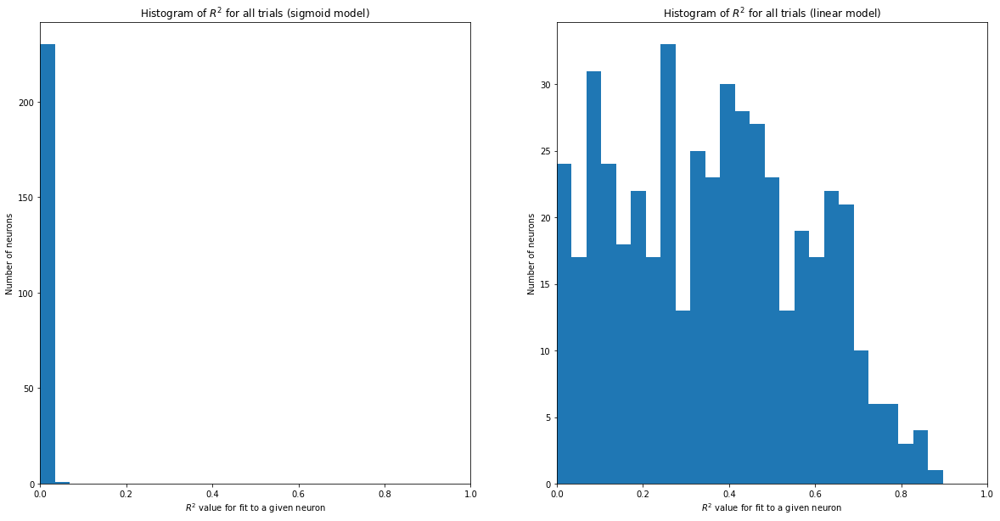

In [38]:
model.eval()
y_next_pred = model(y_test_0_interp, u_test_0).detach().numpy()
err_tot = np.sum( (y_next_pred - y_test_1_interp.detach().numpy())**2, axis=0)
var = np.sum( (y_test_1_interp.detach().numpy() - np.mean(y_test_1_interp.detach().numpy(), axis=0))**2, axis=0)
r_squared = 1 - err_tot / var

y_next_pred_lin = A_hat @ y_test_0_interp.T + B_hat @ u_test_0.T + torch.outer(v_hat,torch.ones(y_test_0_interp.shape[0]))
err_tot_lin = np.sum( (y_next_pred_lin.T.detach().numpy() - y_test_1_interp.detach().numpy())**2, axis=0)
r_squared_lin = 1 - err_tot_lin / var


plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.hist(r_squared,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials (sigmoid model)')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

plt.subplot(1,2,2)
plt.hist(r_squared_lin,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials (linear model)')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

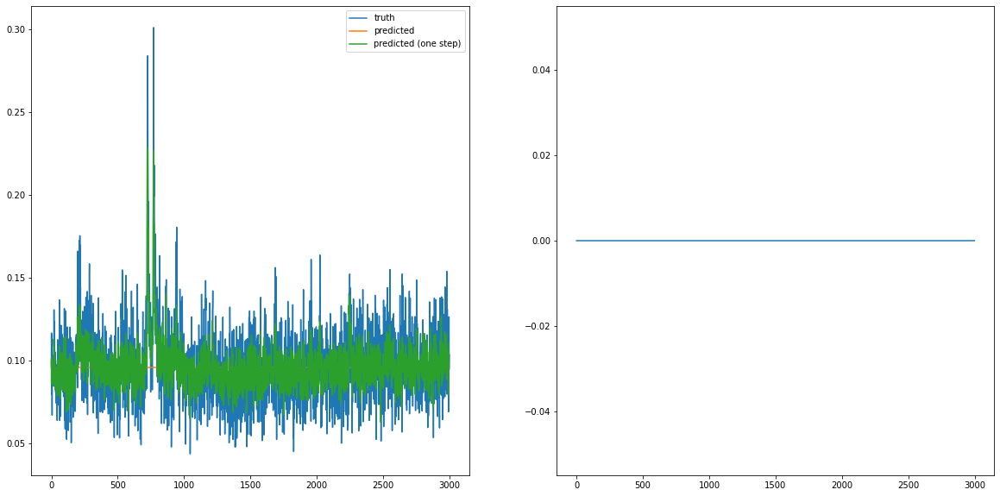

In [48]:
neuron = 5 # 41, 5, 1
T0 = 4 #720
T = 3000

model.eval()
y_test_0_interp = torch.tensor(y_test_full_interp[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_test_1_interp = torch.tensor(y_test_full_interp[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_test_0 = torch.tensor(u_test_full[0:-1,:].copy(), dtype=torch.float32)

state = y_test_0_interp[T0,:].clone()
states = np.zeros((T,y_test_0_interp.shape[1]))
states[0,:] = state

states_onestep = np.zeros((T,y_test_0_interp.shape[1]))

for t in range(T-1):
#     state = model(state,u_test_0[T0+t,:]).detach()
#     states[t+1,:] = state.clone().numpy()
#     state2 = model(y_test_0_interp[T0+t,:],u_test_0[T0+t,:]).detach()
#     states_onestep[t+1,:] = state2.clone().numpy()
    
    state = A_hat @ state + B_hat @ u_test_0[T0+t,:] + v_hat
    states[t+1,:] = state.clone().numpy()
    state2 = A_hat @ y_test_0_interp[T0+t,:] + B_hat @ u_test_0[T0+t,:] + v_hat
    states_onestep[t+1,:] = state2.clone().numpy()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(y_test_1_interp[T0:T0+T,neuron].detach().numpy(),label='truth')
plt.plot(states[:,neuron],label='predicted')
plt.plot(states_onestep[T0:T0+T,neuron],label='predicted (one step)')
plt.legend()

plt.subplot(1,2,2)
plt.plot(u_test_0[T0:T0+T,neuron].detach().numpy(),label='input')
plt.show()

(0.0, 1.0)

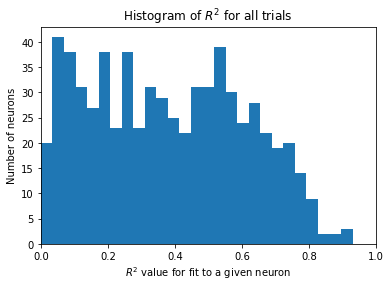

In [50]:
# fit a linear model on linear interpolated data, but with inputs interpolated
bias = torch.ones((y_train_0_interp.shape[0],1))
u_train_0_interp = u_train_0.clone()
missing_train = torch.isnan(y_train_0)
for t in range(missing_train.shape[0]):
    if missing_train[t,0]:
        j = 0
        while missing_train[t-j,0]:
            j -= 1
        u_train_0_interp[t,:] = u_train_0_interp[t-j,:]
        
missing_test = np.isnan(y_test_full)
u_test_0_interp = u_test_0.clone()
for t in range(missing_test.shape[0]):
    if missing_test[t,0]:
        j = 0
        while missing_test[t-j,0]:
            j -= 1
        u_test_0_interp[t,:] = u_test_0_interp[t-j,:]

z_train = torch.concat((y_train_0_interp,u_train_0_interp,bias),axis=1)
theta_hat = torch.linalg.pinv(z_train.T @ z_train) @ z_train.T @ y_train_1_interp
A_hat = theta_hat[0:663,:].T
B_hat = theta_hat[663:-1,:].T
v_hat = theta_hat[2*663,:]

y_pred = A_hat @ y_test_0_interp.T + B_hat @ u_test_0_interp.T + torch.outer(v_hat,torch.ones(u_test_0_interp.shape[0]))
err_tot = np.sum( (y_pred.T.detach().numpy() - y_test_1_interp.detach().numpy())**2, axis=0)
var = np.sum( (y_test_1_interp.detach().numpy() - np.mean(y_test_1_interp.detach().numpy(), axis=0))**2, axis=0)
r_squared = 1 - err_tot / var

plt.hist(r_squared,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

# Train model on different interpolation strategies

In [21]:
# split data on whether or not it is missing
missing_test = np.isnan(y_test_full)
missing_train = np.isnan(y_train_full)
y_train_0 = torch.tensor(y_train_full[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_train_1 = torch.tensor(y_train_full[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_train_0 = torch.tensor(u_train_full[0:-1,:].copy(), dtype=torch.float32)

y_test_0 = torch.tensor(y_test_full[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_test_1 = torch.tensor(y_test_full[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_test_0 = torch.tensor(u_test_full[0:-1,:].copy(), dtype=torch.float32)

num_neurons = y_train_0.shape[1]
num_samples = y_train_0.shape[0]

missing_count = np.sum(missing_train[:,0])
present_count = missing_train.shape[0] - missing_count

y_train_0_present = torch.zeros((present_count-int(missing_count/3)-2,num_neurons))
y_train_1_present = torch.zeros((present_count-int(missing_count/3)-2,num_neurons))
u_train_0_present = torch.zeros((present_count-int(missing_count/3)-2,num_neurons))

y_train_0_missing = torch.zeros((int(missing_count/3),num_neurons))
y_train_1_missing = torch.zeros((int(missing_count/3),num_neurons))
u_train_0_missing = torch.zeros((int(missing_count/3),num_neurons))

present_idx = 0
missing_idx = 0
for t in range(num_samples-1):
    if not missing_train[t,0] and missing_train[t+1,0]:
        y_train_0_missing[missing_idx,:] = y_train_0[t,:]
        y_train_1_missing[missing_idx,:] = y_train_0[t+4,:]
        u_train_0_missing[missing_idx,:] = u_train_0[t,:]
        missing_idx += 1
    if not missing_train[t,0] and not missing_train[t+1,0]:
        y_train_0_present[present_idx,:] = y_train_0[t,:]
        y_train_1_present[present_idx,:] = y_train_0[t+1,:]
        u_train_0_present[present_idx,:] = u_train_0[t,:]
        present_idx += 1
        
missing_count = np.sum(missing_test[:,0])
present_count = missing_test.shape[0] - missing_count

y_test_0_present = torch.zeros((present_count-int(missing_count/3)-1,num_neurons))
y_test_1_present = torch.zeros((present_count-int(missing_count/3)-1,num_neurons))
u_test_0_present = torch.zeros((present_count-int(missing_count/3)-1,num_neurons))

y_test_0_missing = torch.zeros((int(missing_count/3),num_neurons))
y_test_1_missing = torch.zeros((int(missing_count/3),num_neurons))
u_test_0_missing = torch.zeros((int(missing_count/3),num_neurons))

present_idx = 0
missing_idx = 0
for t in range(y_test_0.shape[0]-1):
    if not missing_test[t,0] and missing_test[t+1,0]:
        y_test_0_missing[missing_idx,:] = y_test_0[t,:]
        y_test_1_missing[missing_idx,:] = y_test_0[t+4,:]
        u_test_0_missing[missing_idx,:] = u_test_0[t,:]
        missing_idx += 1
    if not missing_test[t,0] and not missing_test[t+1,0]:
        y_test_0_present[present_idx,:] = y_test_0[t,:]
        y_test_1_present[present_idx,:] = y_test_0[t+1,:]
        u_test_0_present[present_idx,:] = u_test_0[t,:]
        present_idx += 1

In [23]:
class LinearModel(nn.Module):
    def __init__(self, dim):
        super(LinearModel, self).__init__()
        self.A = nn.Linear(dim, dim, bias=False)  
        self.B = nn.Linear(dim, dim, bias=False)
        self.c = nn.Parameter( torch.randn(dim)  )

    def forward(self, x, a):
        return self.B(a) + self.A(x) + self.c
        

model = LinearModel(num_neurons)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=.005)


num_epochs = 1000
batch_size = 500
batch_size_present = int(batch_size*y_train_0_present.shape[0]/(y_train_0_present.shape[0] + y_train_0_missing.shape[0]))
batch_size_missing = batch_size - batch_size_present
f_present = batch_size_present / (batch_size_present + batch_size_missing)
f_missing = batch_size_missing / (batch_size_present + batch_size_missing)
for epoch in range(num_epochs):

    model.train()

    # Zero the gradients
    optimizer.zero_grad()

    # Forward pass: Compute predicted y by passing X to the model
    batch_idx_present = np.random.randint(0, y_train_0_present.shape[0], batch_size_present)
    batch_idx_missing = np.random.randint(0, y_train_0_missing.shape[0], batch_size_missing)
    y_pred_present = model(y_train_0_present[batch_idx_present,:], u_train_0_present[batch_idx_present,:])
    y_pred_missing = model(y_train_0_missing[batch_idx_missing,:], u_train_0_missing[batch_idx_missing,:])
    for j in range(3):
        y_pred_missing = model(y_pred_missing, u_train_0_missing[batch_idx_missing,:])
    loss = f_present*criterion(y_pred_present, y_train_1_present[batch_idx_present,:]) \
            + f_missing*criterion(y_pred_missing,y_train_1_missing[batch_idx_missing,:])
    
    train_loss = loss.item()

    # Backward pass: Compute gradient of the loss with respect to model parameters
    loss.backward()
    optimizer.step()

    # Clamp the weights to be at least 0 -- assumes an excited neuron can't decrease other neuron's rate
    #with torch.no_grad():  # Make sure to use no_grad to avoid affecting the computation graph
    #    model.B.weight.data.clamp_(min=0)

    
    if (epoch+1) % 10 == 0:
        model.eval()

        y_pred_present = model(y_test_0_present, u_test_0_present)
        y_pred_missing = model(y_test_0_missing, u_test_0_missing)
        for j in range(3):
            y_pred_missing = model(y_pred_missing, u_test_0_missing)
        test_loss = criterion(y_pred_present, y_test_1_present).item()
        test_loss2 = criterion(y_pred_missing,y_test_1_missing).item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.6f}, Test Loss: {test_loss:.6f}, Test Loss 2: {test_loss2:.6f}')

Epoch [10/1000], Train Loss: 1.044362, Test Loss: 0.618000, Test Loss 2: 0.707323
Epoch [20/1000], Train Loss: 0.525367, Test Loss: 0.415349, Test Loss 2: 0.469371
Epoch [30/1000], Train Loss: 0.255496, Test Loss: 0.241483, Test Loss 2: 0.259592
Epoch [40/1000], Train Loss: 0.114989, Test Loss: 0.122618, Test Loss 2: 0.095545
Epoch [50/1000], Train Loss: 0.047375, Test Loss: 0.055280, Test Loss 2: 0.040459
Epoch [60/1000], Train Loss: 0.018701, Test Loss: 0.023453, Test Loss 2: 0.008628
Epoch [70/1000], Train Loss: 0.008351, Test Loss: 0.010508, Test Loss 2: 0.007354
Epoch [80/1000], Train Loss: 0.004691, Test Loss: 0.005813, Test Loss 2: 0.004105
Epoch [90/1000], Train Loss: 0.003798, Test Loss: 0.004268, Test Loss 2: 0.003993
Epoch [100/1000], Train Loss: 0.003866, Test Loss: 0.003821, Test Loss 2: 0.003731
Epoch [110/1000], Train Loss: 0.003267, Test Loss: 0.003749, Test Loss 2: 0.003151
Epoch [120/1000], Train Loss: 0.003429, Test Loss: 0.003796, Test Loss 2: 0.002805
Epoch [130/10

Epoch [1000/1000], Train Loss: 0.002594, Test Loss: 0.003300, Test Loss 2: 0.001323


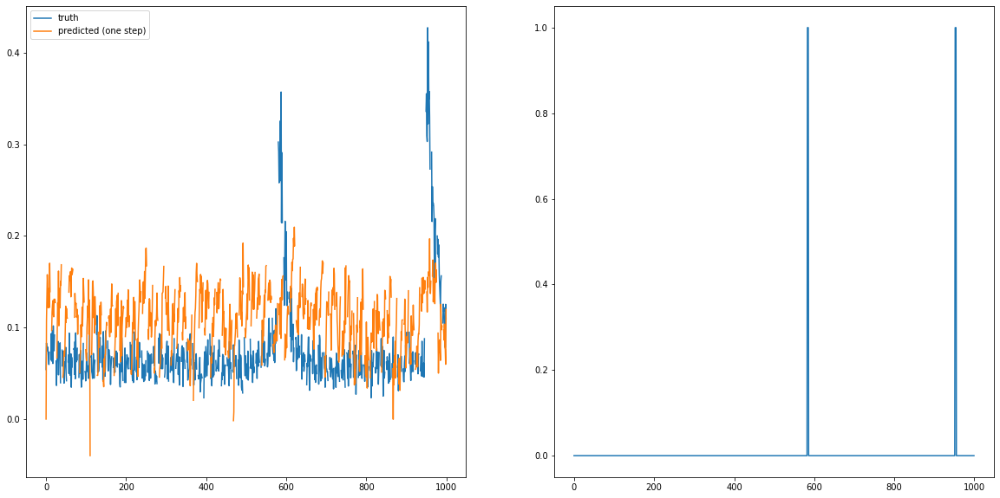

In [26]:
model.eval()
neuron = 10 # 5, 6
T = 1000
T0 = 5

y_test_0 = torch.tensor(y_test_full[0:-1,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
y_test_1 = torch.tensor(y_test_full[1:,:].copy(), dtype=torch.float32)/1000 # scale by 1000 so that data is approximartely in [0,1]
u_test_0 = torch.tensor(u_test_full[0:-1,:].copy(), dtype=torch.float32)
missing_test = torch.isnan(y_test_0)
u_test_0_interp = u_test_0.clone()
for t in range(missing_test.shape[0]):
    if missing_test[t,0]:
        j = 0
        while missing_test[t-j,0]:
            j -= 1
        u_test_0_interp[t,:] = u_test_0_interp[t-j,:]

state = y_test_0[T0,:]
states = np.zeros((T,y_test_0.shape[1]))
states[0,:] = state

states_onestep = np.zeros((T,y_test_0.shape[1]))

for t in range(T-1):
    state = model(state,u_test_0_interp[T0+t,:])
    states[t+1,:] = state.clone().detach().numpy()
    xp = model(y_test_0[T0+t,:],u_test_0_interp[T0+t,:])
    states_onestep[t+1,:] = xp.detach().numpy()
    
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(y_test_1[T0:T+T0,neuron].detach().numpy(),label='truth')
#plt.plot(states[:,neuron],label='predicted')
plt.plot(states_onestep[:,neuron],label='predicted (one step)')
plt.legend()

plt.subplot(1,2,2)
plt.plot(u_test_0[:T,neuron].detach().numpy(),label='input')

(0.0, 1.0)

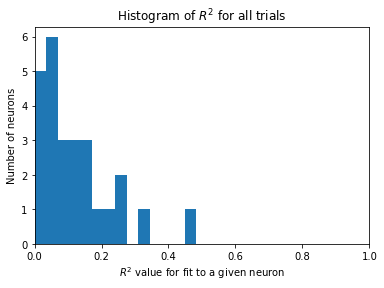

In [28]:
model.eval()
y_pred_present = model(y_test_0_present, u_test_0_present)
y_pred_missing = model(y_test_0_missing, u_test_0_missing)
for j in range(3):
    y_pred_missing = model(y_pred_missing, u_test_0_missing)
               
y_pred = torch.concat((y_pred_present,y_pred_missing),axis=0)
y_true = torch.concat((y_test_1_present,y_test_1_missing),axis=0)
    
err_tot = np.sum( (y_pred.detach().numpy() - y_true.detach().numpy())**2, axis=0)
var = np.sum( (y_true.detach().numpy() - np.mean(y_true.detach().numpy(), axis=0))**2, axis=0)
r_squared = 1 - err_tot / var

plt.hist(r_squared,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

# Learn AR-k model

In [22]:
k = 1
Z = []
xp = y_train_full_interp[k:,:].copy() / 1000
for t in range(y_train_full_interp.shape[0]-k):
    Z.append(np.concatenate((y_train_full_interp[t:t+k,:].copy().flatten() / 1000, u_train_full[t:t+k,:].copy().flatten(),np.ones(1))))
Z = np.array(Z)
Ahat = np.linalg.pinv(Z.T @ Z) @ Z.T @ xp
Ahat = Ahat.T

In [35]:
Ahat = np.load('AR5_estimate.npy')
k = 5

In [36]:
x_pred = []
x_past = []

for i in range(k):
    #x_past.append(y_test_full_interp[i,:].copy().flatten() / 1000)
    x_past.append(np.zeros(663))
    
for t in range(y_test_full_interp.shape[0]-k):
    z = np.array(x_past).flatten()
    z = np.concatenate((z,u_test_full[t:t+k,:].copy().flatten(),np.ones(1)))
    x_next = Ahat @ z
    x_past.pop(0)
    x_past.append(x_next.copy())
    x_pred.append(x_next.copy())
    
x_pred = np.array(x_pred)
x_test_true = y_test_full_interp[k:,:] / 1000

Text(0.5, 1.0, 'Input')

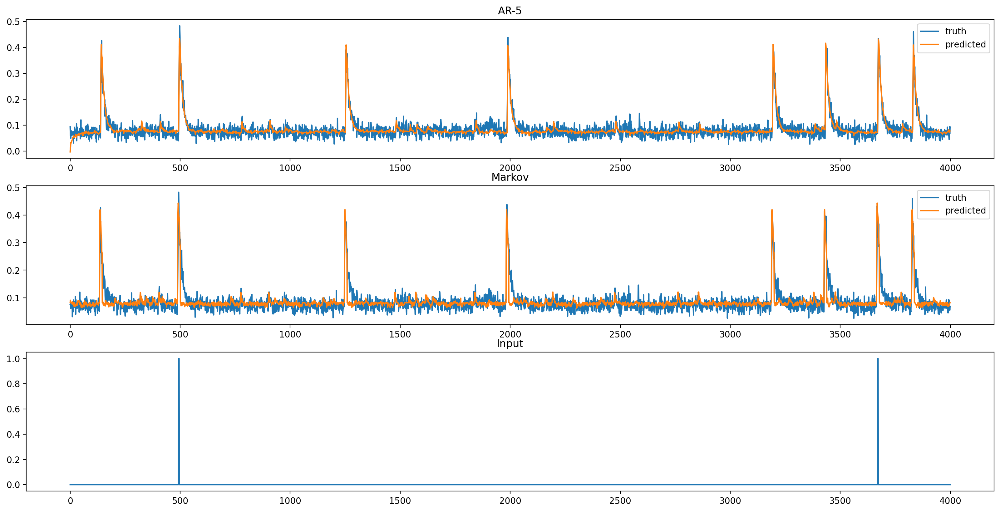

In [134]:
neuron = 53 #idx_sorted[-15] # 41, 53, 8
T = 4000
T0 = 0

plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.plot(x_test_true[T0:T+T0,neuron],label='truth')
plt.plot(x_pred[T0:T+T0,neuron],label='predicted')
plt.title('AR-5')
plt.legend()

plt.subplot(3,1,2)
plt.plot(x_test_true_markov[T0:T+T0,neuron],label='truth')
plt.plot(x_pred_markov[T0:T+T0,neuron],label='predicted')
plt.title('Markov')
plt.legend()

plt.subplot(3,1,3)
plt.plot(u_test_full[k+T0:k+T0+T,neuron],label='input')
plt.title('Input')

In [216]:
for i in range(k):
    e,_ = np.linalg.eig(Ahat[:,i*663:(i+1)*663])
    print(i,np.max(np.abs(e)))
    
print('B')
for i in range(k):
    e,_ = np.linalg.eig(Ahat[:,663*k+i*663:663*k+(i+1)*663])
    print(i,np.max(np.abs(e)))

0 0.20917036647347295
1 0.19525681814452722
2 0.2176366476338938
3 0.28628293889604667
4 0.9832222064352591
B
0 0.045618362603606036
1 0.04407361801032481
2 0.0479727706125775
3 0.08104525771126245
4 0.11211274964827447


(0.0, 1.0)

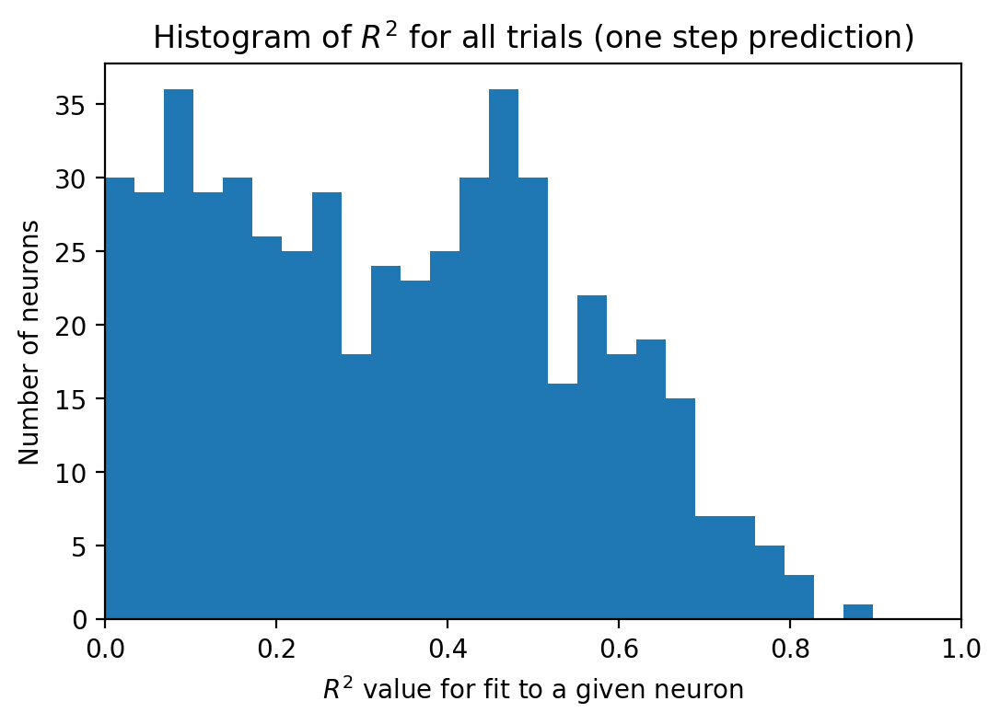

In [25]:
err_tot_lin = np.sum( (x_pred - x_test_true)**2, axis=0)
var = np.sum( (x_test_true - np.mean(x_test_true, axis=0))**2, axis=0)
r_squared_lin = 1 - err_tot_lin / var

plt.hist(r_squared_lin,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials (one step prediction)')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

(6734, 663)


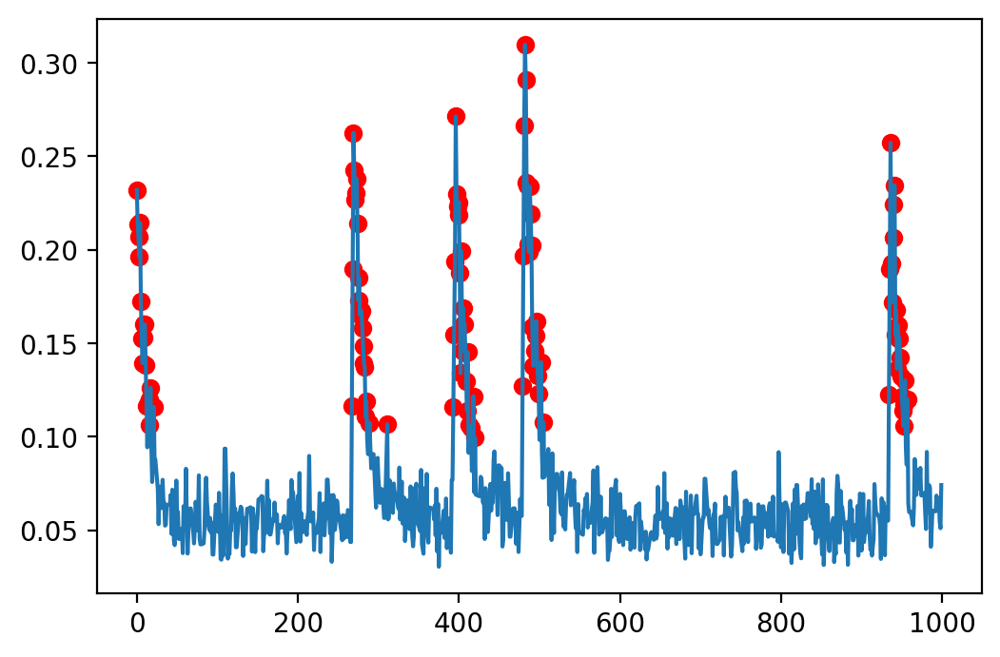

In [62]:
neuron = 1
print(x_test_true.shape)
mean_threshold = np.median(x_test_true[:,neuron])
lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
lower_tail_data = x_test_true[lower_tail_idx,neuron]
lower_tail_std = np.std(lower_tail_data)
spike_threshold = mean_threshold + 6*lower_tail_std

T = 1000
spiking = (x_test_true[:T,neuron] > spike_threshold)
x_test_true2 = x_test_true[:T,:]
plt.plot(x_test_true[:T,neuron])
#plt.plot(x_pred[:T,neuron])
idx = np.linspace(0,T-1,T)
plt.scatter(idx[spiking],x_test_true2[spiking,neuron],color='r')

In [56]:
neuron = 1
mean_threshold = np.median(x_test_true[:,neuron])
lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
lower_tail_data = x_test_true[lower_tail_idx,neuron]
lower_tail_std = np.std(lower_tail_data)
true_spike_threshold = mean_threshold + 6*lower_tail_std
detect_spike_threshold = mean_threshold + 4*lower_tail_std

predicted_spikes = (x_pred[:,neuron] > detect_spike_threshold)
true_spikes = (x_test_true[:,neuron] > true_spike_threshold)
tpr = np.sum(np.logical_and(predicted_spikes,true_spikes)) / np.sum(true_spikes)
fpr = np.sum(np.logical_and(predicted_spikes,~true_spikes)) / np.sum(~true_spikes)
print('tpr = ' + str(tpr) + ', fpr = ' + str(fpr))

tpr = 0.9736070381231672, fpr = 0.03666391412056152


In [26]:
tpr = []
fpr = []
thresholds = np.linspace(-2,5,15)

for thresholds_idx in range(len(thresholds)):
    tp_total = 0
    fp_total = 0
    p_total = 0
    n_total = 0

    for neuron in range(x_test_true.shape[1]):
        mean_threshold = np.median(x_test_true[:,neuron])
        lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
        lower_tail_data = x_test_true[lower_tail_idx,neuron]
        lower_tail_std = np.std(lower_tail_data)
        true_spike_threshold = mean_threshold + 6*lower_tail_std
        detect_spike_threshold = mean_threshold + thresholds[thresholds_idx]*lower_tail_std

        predicted_spikes = (x_pred[:,neuron] > detect_spike_threshold)
        true_spikes = (x_test_true[:,neuron] > true_spike_threshold)
        tp_total += np.sum(np.logical_and(predicted_spikes,true_spikes))
        fp_total += np.sum(np.logical_and(predicted_spikes,~true_spikes))
        p_total += np.sum(true_spikes)
        n_total += np.sum(~true_spikes)

    tpr.append(tp_total / p_total)
    fpr.append(fp_total / n_total)

tpr_ark1 = copy.copy(tpr)
fpr_ark1 = copy.copy(fpr)

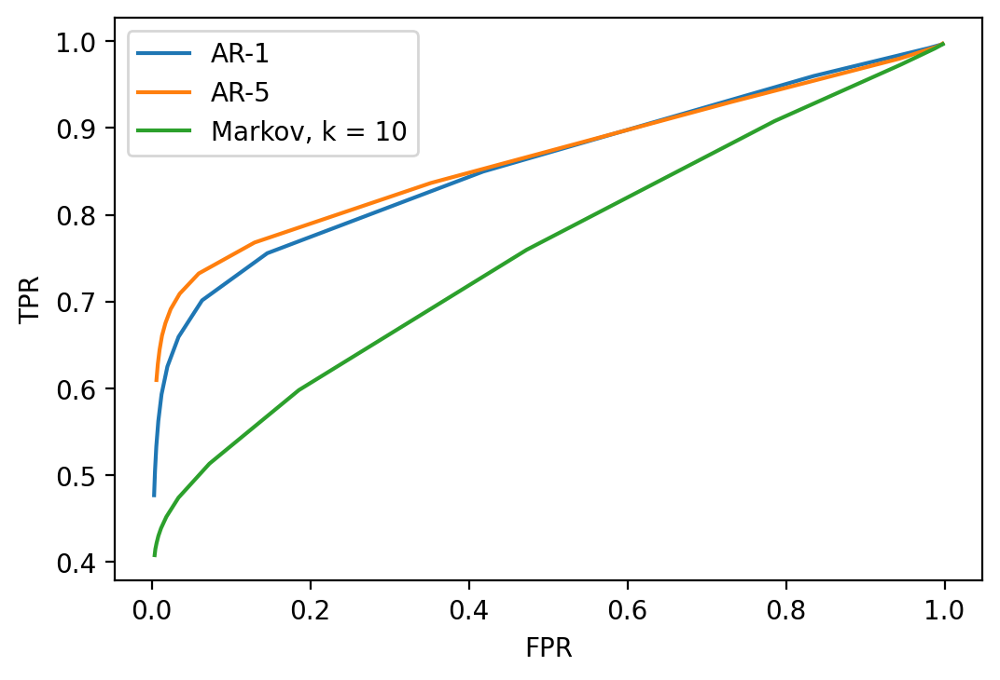

In [32]:
plt.plot(fpr_ark1,tpr_ark1,label='AR-1')
#plt.plot(fpr_k2,tpr_k2,label='AR-2')
plt.plot(fpr_ark5,tpr_ark5,label='AR-5')
#plt.plot(fpr_markov_tau2,tpr_markov_tau2,label='Markov, k = 2')
plt.plot(fpr_markov_tau10,tpr_markov_tau10,label='Markov, k = 10')
#plt.plot(fpr_markov_tau20,tpr_markov_tau20,label='Markov, k = 20')
#plt.plot(fpr_markov_lds_tau3,tpr_markov_lds_tau3,label='Markov LDS, k = 3')
#plt.plot(fpr_markov_lds_tau10,tpr_markov_lds_tau10,label='Markov LDS, k = 10')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
#plt.xlim([-0.1,0.2])
#plt.ylim([-0.1,1.1])

# Learn Markov Model

In [28]:
U = []
Y = []
seq_length = y_train_full.shape[0] - 1
tau = 10
I = []
for t in range(tau,seq_length):
    if ~np.isnan( y_train_full[t+1][0] ):
        U.append( u_train_full[t-tau:t,:].reshape(-1) )
        Y.append( y_train_full[t+1] / 1000 )
        I.append(t)
U = np.array(U)
U = np.concatenate( (np.ones((U.shape[0],1)),U), axis=1)
Y = np.array(Y)
Theta = np.linalg.lstsq(U, Y, rcond=None)[0].T

In [29]:
x_pred_markov = [] #list(np.zeros( (tau,u_test_full.shape[0]) ))
for t in range(tau,u_test_full.shape[0]):
    u_bar = np.concatenate( ([1.],u_test_full[t-tau:t,:].reshape(-1)) )
    x_pred_markov.append( Theta @ u_bar )
x_pred_markov = np.array(x_pred_markov)   

10 (663, 6631)


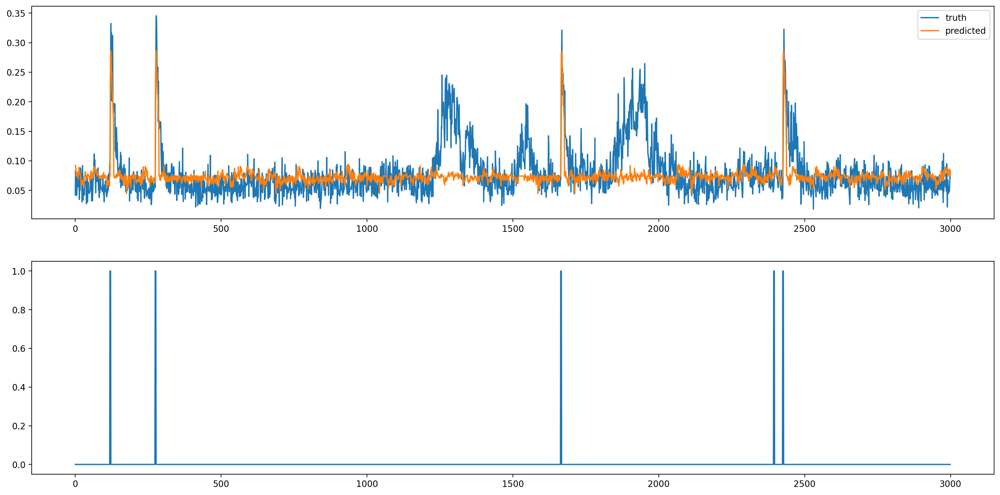

In [72]:
neuron = idx_sorted[-15] # 41, 53, 8
T = 3000
T0 = 0
print(tau,Theta.shape)

plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(y_test_full_interp[tau+T0:tau+T+T0,neuron] / 1000,label='truth')
plt.plot(x_pred_markov[T0:T+T0,neuron],label='predicted')
plt.legend()

plt.subplot(2,1,2)
plt.plot(u_test_full[tau+T0:tau+T0+T,neuron],label='input')

(0.0, 1.0)

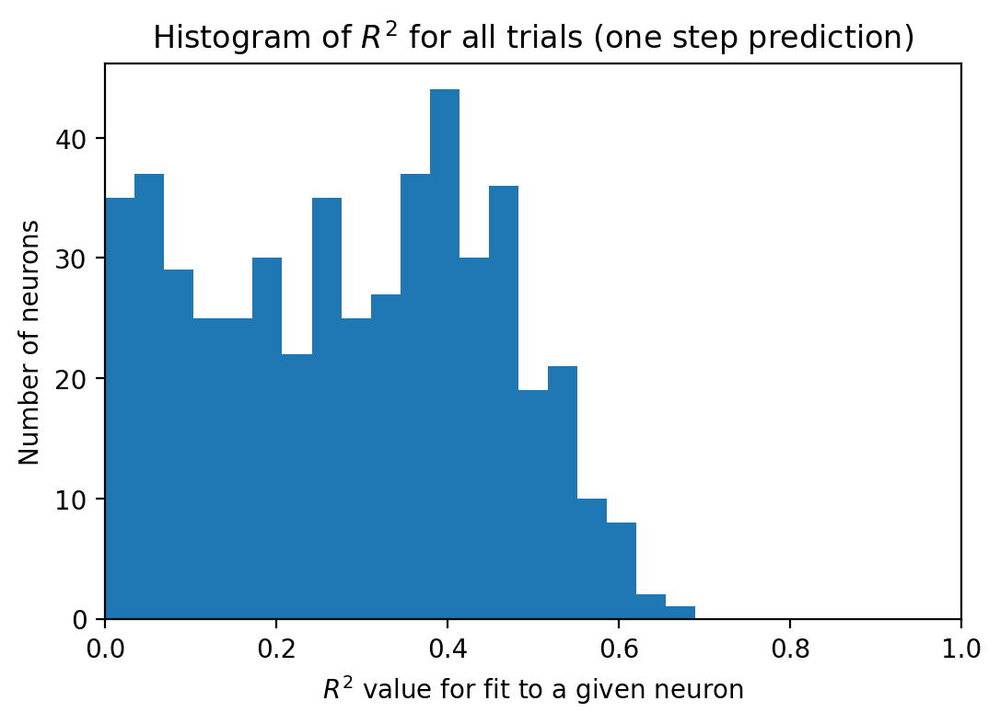

In [34]:
x_test_true_markov = y_test_full_interp[tau:,:].copy() / 1000
err_tot_lin = np.sum( (x_pred_markov - x_test_true_markov)**2, axis=0)
var = np.sum( (x_test_true_markov - np.mean(x_test_true_markov, axis=0))**2, axis=0)
r_squared_lin = 1 - err_tot_lin / var

plt.hist(r_squared_lin,np.linspace(0,1,30))
plt.title('Histogram of $R^2$ for all trials (one step prediction)')
plt.xlabel('$R^2$ value for fit to a given neuron')
plt.ylabel('Number of neurons')
plt.xlim([0,1])

In [31]:
tpr = []
fpr = []
thresholds = np.linspace(-2,5,15)
x_test_true_markov = y_test_full_interp[tau:,:].copy() / 1000

for thresholds_idx in range(len(thresholds)):
    tp_total = 0
    fp_total = 0
    p_total = 0
    n_total = 0

    for neuron in range(x_test_true.shape[1]):
        mean_threshold = np.median(x_test_true_markov[:,neuron])
        lower_tail_idx = (x_test_true_markov[:,neuron] < mean_threshold)
        lower_tail_data = x_test_true_markov[lower_tail_idx,neuron]
        lower_tail_std = np.std(lower_tail_data)
        true_spike_threshold = mean_threshold + 6*lower_tail_std
        detect_spike_threshold = mean_threshold + thresholds[thresholds_idx]*lower_tail_std

        predicted_spikes = (x_pred_markov[:,neuron] > detect_spike_threshold)
        true_spikes = (x_test_true_markov[:,neuron] > true_spike_threshold)
        tp_total += np.sum(np.logical_and(predicted_spikes,true_spikes))
        fp_total += np.sum(np.logical_and(predicted_spikes,~true_spikes))
        p_total += np.sum(true_spikes)
        n_total += np.sum(~true_spikes)

    tpr.append(tp_total / p_total)
    fpr.append(fp_total / n_total)
    
x_pred_markov_tau10 = x_pred_markov.copy()
fpr_markov_tau10 = copy.copy(fpr)
tpr_markov_tau10 = copy.copy(tpr)
# Theta_tau20 = Theta.copy()

# Fit LDS to Markov Parameters

In [188]:
# Gradient Descent
import torch
import torch.optim as optim

markov_params = np.zeros((tau,d,d))
#print(Theta.shape)
for i in range(tau):
    markov_params[i,:,:] = Theta[:,(1+i*d):(1+(i+1)*d)]
#     e,_ = np.linalg.eig(Theta[:,(1+i*d):(1+(i+1)*d)])
#     print(np.max(np.abs(e)))
markov_params = torch.tensor(markov_params, dtype=torch.float32)

def project_mat(A, eig_threshold = 0.5):
    L, V = torch.linalg.eig(A)
    L[L.abs()>eig_threshold] = L[L.abs()>eig_threshold]/L.abs()[L.abs()>eig_threshold]*eig_threshold
#     L = L/L.abs().max()
    return torch.real(V @ torch.diag(L) @ torch.linalg.inv(V))

# Initialize A and B with Least squares
B = Theta[:,1:d+1]
A = .9*np.linalg.lstsq(B.T, Theta[:,d+1:2*d+1].T, rcond=None)[0].T
# A = np.eye(d)*.001
# B = np.eye(d)*.5
B = torch.tensor(B, dtype=torch.float32, requires_grad=True)
A = torch.tensor(A, dtype=torch.float32, requires_grad=True)

# A = torch.randn((d, d), requires_grad=True)
# B = torch.randn((d, d), requires_grad=True)

# C and D are known
C = torch.eye(d)
D = torch.zeros((d, d))

# Setup the optimizer
optimizer = optim.Adam([A, B], lr=0.005)

# Define the loss function
loss_fn = torch.nn.MSELoss()

# Training loop
num_epochs = 2000
for epoch in range(num_epochs):
    optimizer.zero_grad()  # Clear previous gradients
    
    # Generate Markov parameters from A and B
    simulated_markov_params = []  # D is the first Markov parameter, but D=0 so it's not used here
    current_state_response = B  # The response at the first step
    
    for _ in range(tau):
        simulated_markov_params.append(current_state_response)
        current_state_response = torch.matmul(A, current_state_response)
    
    simulated_markov_params = torch.stack(simulated_markov_params)
    
    # Compute the loss
    loss = loss_fn(simulated_markov_params.flatten(), markov_params.flatten()) # + torch.linalg.eig(A)[0].abs().sum()
    
    # Backpropagation
    loss.backward()
    
    # Update A and B
    optimizer.step()
    
    with torch.no_grad():  # Ensure no gradient computation for this operation
#         A.clamp_(min=0)
#         B.clamp_(min=0)
#         A *= torch.eye(d, dtype=torch.float32)
        project_mat(A, eig_threshold = 0.99)
        
    # Print loss every 100 epochs
    if epoch % 100 == 0:
        L, V = torch.linalg.eig(A)
        print(f'Epoch {epoch+1}, Loss: {loss.item()}, max-eig: {L.abs().max()}')

with torch.no_grad():  # Ensure no gradient computation for this operation
#     A.clamp_(min=0)
#     B.clamp_(min=0)
    A=project_mat(A,0.95)
    pass
            
A = A.detach().numpy()
B = B.detach().numpy()
C = C.numpy()

Epoch 1, Loss: 2.6358334253018256e-06, max-eig: 0.28114500641822815
Epoch 101, Loss: 2.585134780019871e-06, max-eig: 0.7960233688354492
Epoch 201, Loss: 2.289538542754599e-06, max-eig: 1.0506614446640015
Epoch 301, Loss: 2.012697223108262e-06, max-eig: 1.1200627088546753
Epoch 401, Loss: 1.8093458038492827e-06, max-eig: 1.0926318168640137
Epoch 501, Loss: 1.6365128203688073e-06, max-eig: 1.098961591720581
Epoch 601, Loss: 1.4895518916091532e-06, max-eig: 1.1027075052261353
Epoch 701, Loss: 1.382977075081726e-06, max-eig: 1.1053800582885742
Epoch 801, Loss: 1.2901780337415403e-06, max-eig: 1.1058367490768433
Epoch 901, Loss: 1.2025002433802001e-06, max-eig: 1.105167031288147
Epoch 1001, Loss: 1.124270738728228e-06, max-eig: 1.1069802045822144
Epoch 1101, Loss: 1.0527355698286556e-06, max-eig: 1.1070685386657715
Epoch 1201, Loss: 9.930521400747239e-07, max-eig: 1.1099363565444946
Epoch 1301, Loss: 9.403963758813916e-07, max-eig: 1.1105756759643555
Epoch 1401, Loss: 8.932497053137922e-07,

In [189]:
#A=project_mat(torch.tensor(A),0.95).detach().numpy()
v = Theta[:,0]
x_pred_markov_lds = []
x_hat = y_test_full_interp[0,:].copy().flatten() / 1000
for t in range(y_test_full.shape[0]):
    x_hat = A @ x_hat + B @ u_test_full[t,:]
    x_pred_markov_lds.append( v + x_hat )
x_pred_markov_lds = np.array(x_pred_markov_lds)   

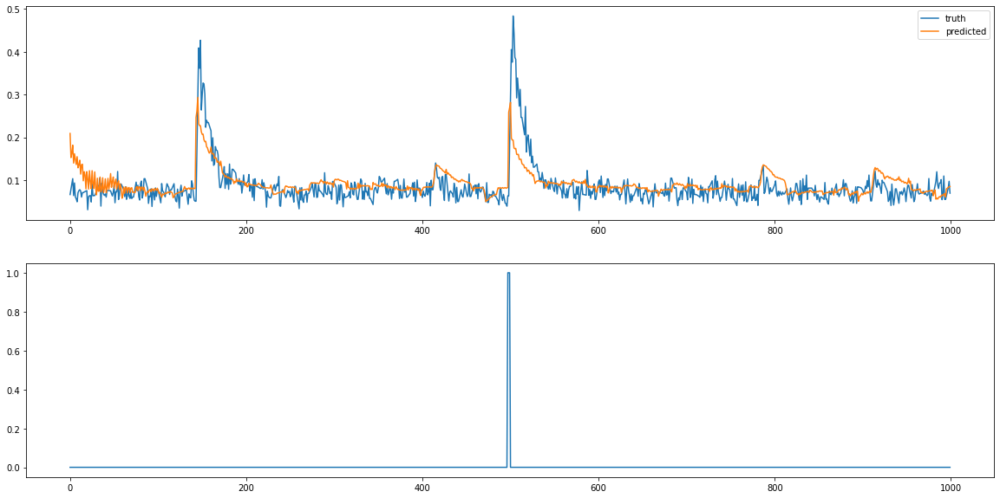

In [190]:
neuron = 53 # 41, 53, 8
T = 1000
T0 = 0

plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(x_test_true[T0:T+T0,neuron],label='truth')
plt.plot(x_pred_markov_lds[T0:T+T0,neuron],label='predicted')
plt.legend()

plt.subplot(2,1,2)
plt.plot(u_test_full[k+T0:k+T0+T,neuron],label='input')

In [191]:
tpr = []
fpr = []
thresholds = np.linspace(-2,5,15)

x_test_true = y_test_full_interp[0:,:] / 1000

print(x_pred_markov_lds.shape)
print(x_test_true.shape)

for thresholds_idx in range(len(thresholds)):
    tp_total = 0
    fp_total = 0
    p_total = 0
    n_total = 0

    for neuron in range(x_test_true.shape[1]):
        mean_threshold = np.median(x_test_true[:,neuron])
        lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
        lower_tail_data = x_test_true[lower_tail_idx,neuron]
        lower_tail_std = np.std(lower_tail_data)
        true_spike_threshold = mean_threshold + 6*lower_tail_std
        detect_spike_threshold = mean_threshold + thresholds[thresholds_idx]*lower_tail_std

        predicted_spikes = (x_pred_markov_lds[:,neuron] > detect_spike_threshold)
        true_spikes = (x_test_true[:,neuron] > true_spike_threshold)
        tp_total += np.sum(np.logical_and(predicted_spikes,true_spikes))
        fp_total += np.sum(np.logical_and(predicted_spikes,~true_spikes))
        p_total += np.sum(true_spikes)
        n_total += np.sum(~true_spikes)

    tpr.append(tp_total / p_total)
    fpr.append(fp_total / n_total)
    

    
x_pred_markov_lds_tau10 = x_pred_markov.copy()
fpr_markov_lds_tau10 = copy.copy(fpr)
tpr_markov_lds_tau10 = copy.copy(tpr)
Theta_tau10 = Theta.copy()

(6739, 663)
(6739, 663)


# Analyze connectivity

2.3701293702235
0.48705805944344355
0.5507686696017272


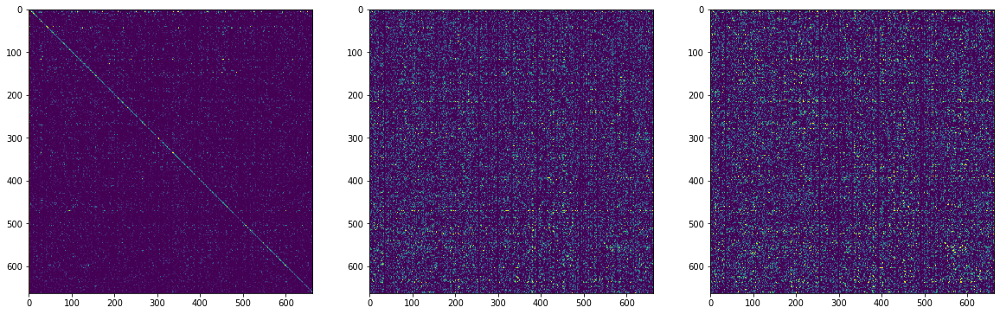

In [245]:
plt.figure(figsize=(20, 10))
plt.subplot(1,3,1)
print(np.linalg.norm(Theta[:,0:663]))
print(np.linalg.norm(Theta[:,663:2*663]))
print(np.linalg.norm(Theta[:,2*663:3*663]))
plt.imshow(Theta[:,0:663], norm=colors.Normalize(vmin=0.0, vmax=.01))
#plt.colorbar()
plt.subplot(1,3,2)
plt.imshow(Theta[:,663:2*663], norm=colors.Normalize(vmin=0.0, vmax=.001))
plt.subplot(1,3,3)
plt.imshow(Theta[:,4*663:5*663], norm=colors.Normalize(vmin=0.0, vmax=.001))
#plt.colorbar()
plt.show()

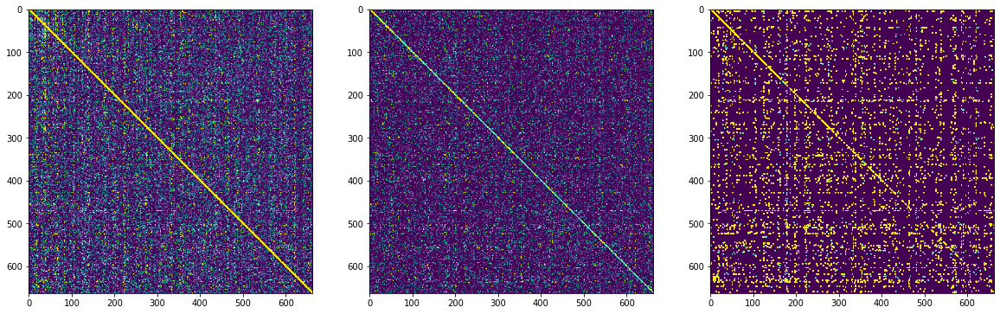

In [228]:
plt.figure(figsize=(20, 10))
plt.subplot(1,3,1)
i=4
plt.imshow(Ahat[:,i*663:(i+1)*663], norm=colors.Normalize(vmin=0.0, vmax=.01))
#plt.colorbar()
plt.subplot(1,3,2)
i=3
plt.imshow(Ahat[:,i*663:(i+1)*663], norm=colors.Normalize(vmin=0.0, vmax=.01))
plt.subplot(1,3,3)
i=2
threshold = 0.95*np.mean(np.diag(Ahat[:,i*663:(i+1)*663]))
plt.imshow(Ahat[:,i*663:(i+1)*663]>threshold, norm=colors.Normalize(vmin=0.0, vmax=.01))
#plt.colorbar()
plt.show()

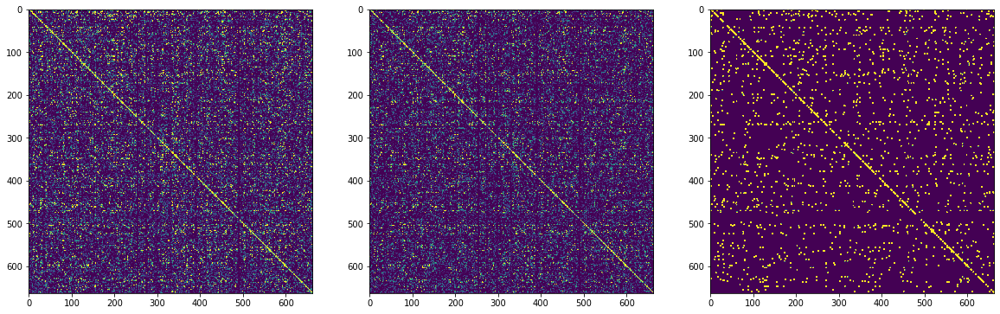

In [224]:
plt.figure(figsize=(20, 10))
plt.subplot(1,3,1)
i=4
plt.imshow(Ahat[:,663*k+i*663:663*k+(i+1)*663], norm=colors.Normalize(vmin=0.0, vmax=.001))
#plt.colorbar()
plt.subplot(1,3,2)
i=3
plt.imshow(Ahat[:,663*k+i*663:663*k+(i+1)*663], norm=colors.Normalize(vmin=0.0, vmax=.001))
plt.subplot(1,3,3)
i=2
threshold = 0.95*np.mean(np.diag(Ahat[:,663*k+i*663:663*k+(i+1)*663]))
plt.imshow(Ahat[:,663*k+i*663:663*k+(i+1)*663]>threshold, norm=colors.Normalize(vmin=0.0, vmax=.001))
#plt.colorbar()
plt.show()

[0.281499692685925, 0.4892440073755378, 0.4505224339274739, 0.19606637984019668, 0.47203441917639827, 0.46896127842655194, 0.5039950829748002, 0.189920098340504, 0.33128457283343576, 0.47203441917639827]
[0.6020851433536055, 0.6174915905814512, 0.6702654071075124, 0.015432098765432098, 0.9157987062822059, 0.5662308129619101, 0.7443890274314214, 0.0, 0.8919839679358718, 0.5773252614199229]


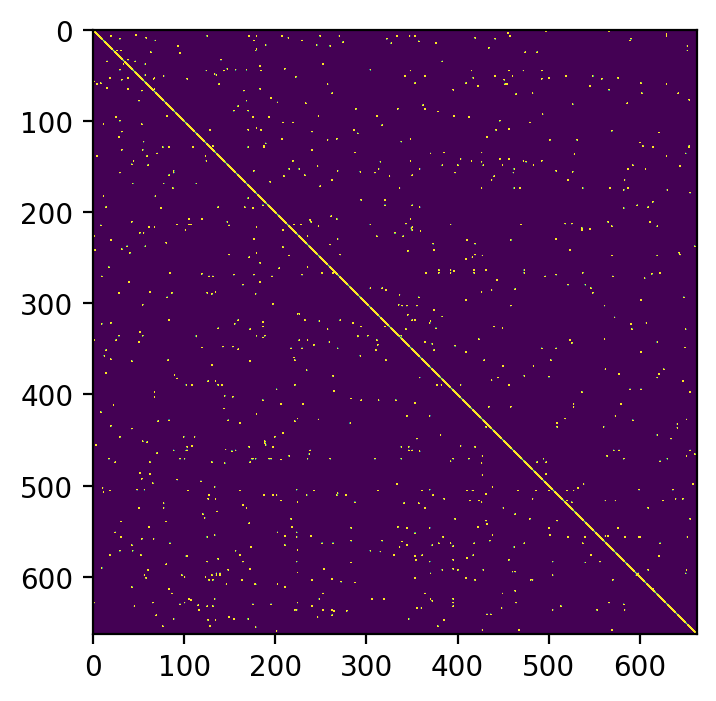

In [135]:
connections = []
avg = np.zeros((663,663))
for i in range(k):
    threshold = 0.95*np.mean(np.diag(Ahat[:,i*663:(i+1)*663]))
    connections.append(Ahat[:,i*663:(i+1)*663] > threshold)
    threshold = 0.95*np.mean(np.diag(Ahat[:,663*k+i*663:663*k+(i+1)*663]))
    connections.append(Ahat[:,663*k+i*663:663*k+(i+1)*663] > threshold)
    avg += Ahat[:,i*663:(i+1)*663]
    avg += Ahat[:,663*k+i*663:663*k+(i+1)*663]
    
avg_thresh = 0.2*np.mean(np.diag(avg))
avg_connect = (avg > avg_thresh)

agreement = []
disagree = []
total = np.sum(avg_connect)
for i in range(k):
    agreement.append(np.sum(np.logical_and(connections[i],avg_connect)) / total)
    agreement.append(np.sum(np.logical_and(connections[i+k],avg_connect)) / total)
    disagree.append(np.sum(np.logical_and(connections[i],~avg_connect)) / np.sum(connections[i]))
    disagree.append(np.sum(np.logical_and(connections[i+k],~avg_connect)) / np.sum(connections[i+k]))
print(agreement)
print(disagree)

#plt.imshow(avg / 2*k, norm=colors.Normalize(vmin=0.0, vmax=.05))
plt.imshow(avg_connect, norm=colors.Normalize(vmin=0.0, vmax=.05))

[0.3290653008962868, 0.998719590268886, 0.022193768672641914, 0.7191634656423389, 0.998719590268886]
[0.0, 0.9946761313220941, 0.2, 0.9536017182509087, 0.9946760586452617]


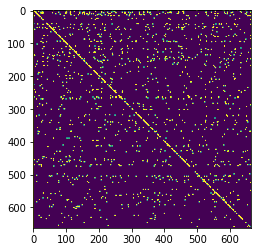

In [251]:
connections = []
avg = np.zeros((663,663))
for i in range(k):
    threshold = 400*np.mean(Theta[:,i*663:(i+1)*663])
    connections.append(Theta[:,i*663:(i+1)*663] > threshold)
    avg += Theta[:,i*663:(i+1)*663]
    
avg_thresh = 400*np.mean(avg)
avg_connect = (avg > avg_thresh)

agreement = []
disagree = []
total = np.sum(avg_connect)
for i in range(k):
    agreement.append(np.sum(np.logical_and(connections[i],avg_connect)) / total)
    disagree.append(np.sum(np.logical_and(connections[i],~avg_connect)) / np.sum(connections[i]))
print(agreement)
print(disagree)

#plt.imshow(avg / 2*k, norm=colors.Normalize(vmin=0.0, vmax=.05))
plt.imshow(avg_connect, norm=colors.Normalize(vmin=0.0, vmax=.05))

In [136]:
avg_connect_markov = np.zeros((663,663))
for i in range(tau):
    avg_connect_markov += Theta[:,1+i*663:1+(i+1)*663]
    
avg_connect_ark = np.zeros((663,663))
rollout_len = 50
params = []
A_params = []
B_params = []
for i in range(k):
    params.append(np.zeros((663,663)))
    A_params.insert(0,Ahat[:,i*663:(i+1)*663])
    B_params.insert(0,Ahat[:,663*k+i*663:663*k+(i+1)*663])
    
for t in range(rollout_len):
    param_new = np.zeros((663,663))
    for i in range(k):
        param_new += A_params[i] @ params[i]
    if t <= k-1:
        param_new += B_params[t]
    params = params[:-1]
    params.insert(0,param_new)
    avg_connect_ark += params[0]

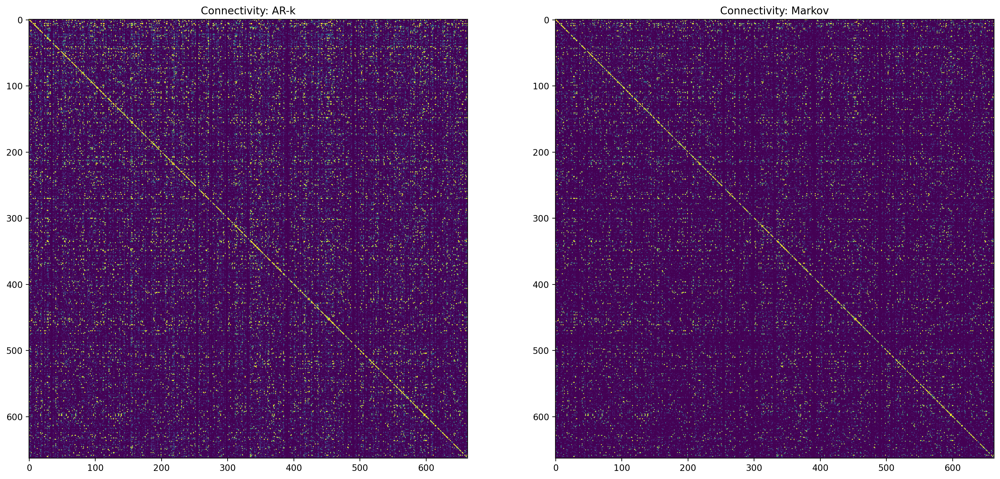

In [140]:
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.imshow(avg_connect_ark, norm=colors.Normalize(vmin=0.0, vmax=.025))
plt.title('Connectivity: AR-k')
plt.subplot(1,2,2)
plt.imshow(avg_connect_markov, norm=colors.Normalize(vmin=0.0, vmax=.025))
plt.title('Connectivity: Markov')
plt.show()

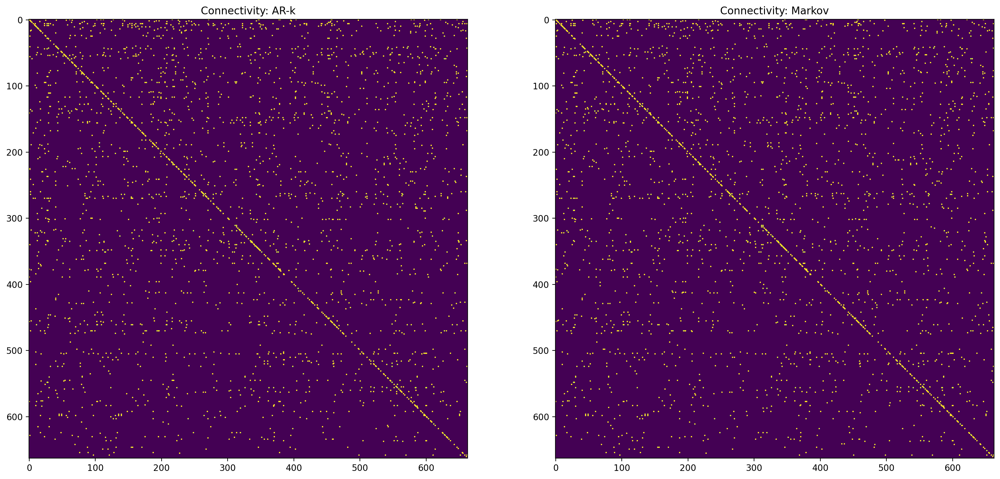

0.9286226685796269 0.14167862266857964


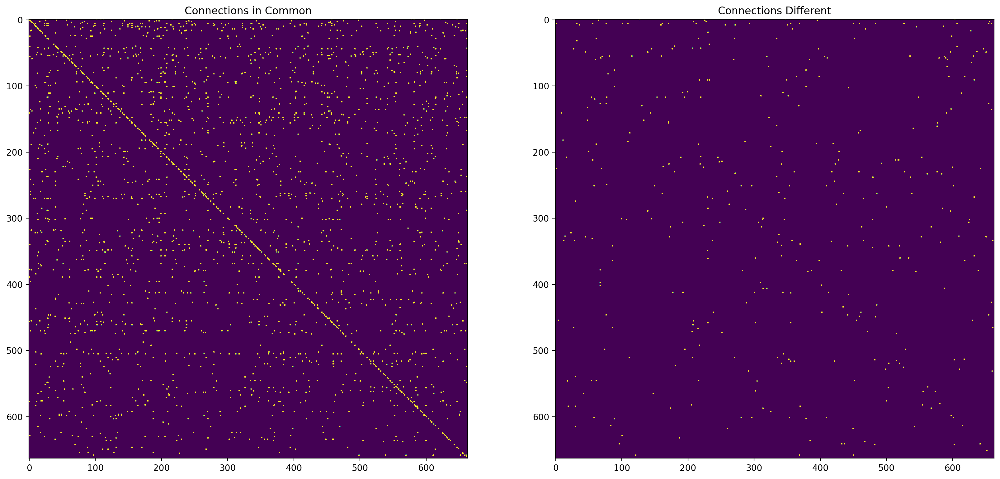

In [141]:
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
threshold = 0.75*np.mean(np.diag(avg_connect_ark))
connect_ark = avg_connect_ark > threshold
plt.imshow(connect_ark, norm=colors.Normalize(vmin=0.0, vmax=.01))
plt.title('Connectivity: AR-k')
plt.subplot(1,2,2)
threshold = 0.75*np.mean(np.diag(avg_connect_markov))
connect_markov = avg_connect_markov>threshold
plt.imshow(connect_markov, norm=colors.Normalize(vmin=0.0, vmax=.01))
plt.title('Connectivity: Markov')
plt.show()

same = np.logical_and(connect_ark,connect_markov)
diff = np.logical_or(np.logical_and(connect_ark,~connect_markov),np.logical_and(~connect_ark,connect_markov))
print(np.sum(same) / np.sum(connect_ark),np.sum(diff) / np.sum(connect_ark))
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.imshow(same, norm=colors.Normalize(vmin=0.0, vmax=.01))
plt.title('Connections in Common')
plt.subplot(1,2,2)
plt.imshow(diff, norm=colors.Normalize(vmin=0.0, vmax=.01))
plt.title('Connections Different')
plt.show()

# Initial spike prediction

(6734, 663)


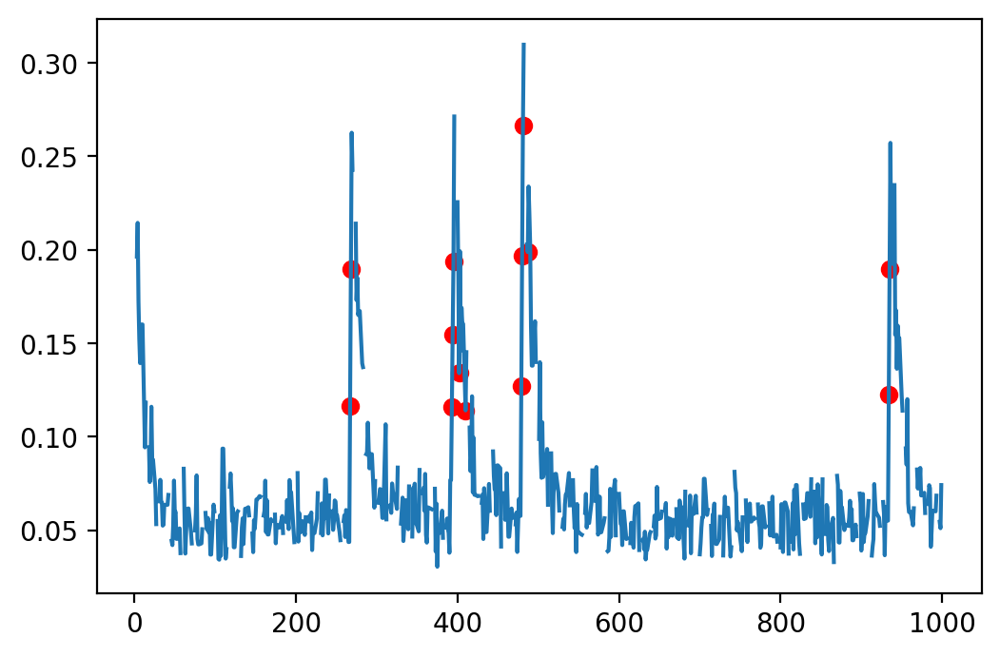

In [63]:
neuron = 1
x_test_true = y_test_full_interp[k:,:].copy() / 1000
print(x_test_true.shape)
mean_threshold = np.median(x_test_true[:,neuron])
lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
lower_tail_data = x_test_true[lower_tail_idx,neuron]
lower_tail_std = np.std(lower_tail_data)
spike_threshold = mean_threshold + 6*lower_tail_std
finite_diff = x_test_true[1:,neuron] - x_test_true[0:-1,neuron]
finite_diff_threshold = np.percentile(finite_diff, 95)
finite_diff_spike = (finite_diff > finite_diff_threshold)

T = 1000
spiking = np.logical_and((x_test_true[:T,neuron] > spike_threshold),finite_diff_spike[:T])
spiking = np.logical_and(spiking, ~missing_test[:T,neuron])
# spiking1 = (x_test_true[:T,neuron] > spike_threshold)
# spiking = finite_diff_spike[:T]
# print(np.sum(np.logical_and(spiking,spiking1)) / np.sum(spiking1))
x_test_true2 = x_test_true[:T,:].copy()
x_test_true2[missing_test[:T,neuron],neuron] = np.nan
plt.plot(x_test_true2[:,neuron])
#plt.plot(x_pred[:T,neuron])
idx = np.linspace(0,T-1,T)
x_test_true2 = x_test_true[:T,:].copy()
plt.scatter(idx[spiking],x_test_true2[spiking,neuron],color='r')

In [38]:
tpr2 = []
fpr2 = []
thresholds = np.linspace(-2,5,15)

missed_spikes = []
pred_spikes = []

for thresholds_idx in range(len(thresholds)):
    tp_total = 0
    fp_total = 0
    p_total = 0
    n_total = 0

    for neuron in range(x_test_true.shape[1]):
        mean_threshold = np.median(x_test_true[:,neuron])
        lower_tail_idx = (x_test_true[:,neuron] < mean_threshold)
        lower_tail_data = x_test_true[lower_tail_idx,neuron]
        lower_tail_std = np.std(lower_tail_data)
        true_spike_threshold = mean_threshold + 6*lower_tail_std
        detect_spike_threshold = mean_threshold + thresholds[thresholds_idx]*lower_tail_std
        finite_diff = x_test_true[1:,neuron] - x_test_true[0:-1,neuron]
        finite_diff_threshold = np.percentile(finite_diff, 95)
        finite_diff_spike = (finite_diff > finite_diff_threshold)

        predicted_spikes = (x_pred[:-1,neuron] > detect_spike_threshold)
        true_spikes = np.logical_and((x_test_true[:-1,neuron] > true_spike_threshold), finite_diff_spike)
        true_spikes = np.logical_and(true_spikes, ~missing_test[k:-1,neuron])
        tp_total += np.sum(np.logical_and(predicted_spikes,true_spikes))
        fp_total += np.sum(np.logical_and(predicted_spikes,~true_spikes))
        p_total += np.sum(true_spikes)
        n_total += np.sum(~true_spikes)
        if thresholds_idx == 6:
            missed_spikes.append(np.logical_and(~predicted_spikes,true_spikes))
            pred_spikes.append(true_spikes)

    tpr2.append(tp_total / p_total)
    fpr2.append(fp_total / n_total)

In [52]:
tpr2_markov = []
fpr2_markov = []
thresholds = np.linspace(-2,5,15)
shift = 6

missed_spikes_markov = []
pred_spikes_markov = []

for thresholds_idx in range(len(thresholds)):
    tp_total = 0
    fp_total = 0
    p_total = 0
    n_total = 0

    for neuron in range(x_test_true.shape[1]):
        mean_threshold = np.median(x_test_true[:,neuron])
        lower_tail_idx = (x_test_true_markov[:,neuron] < mean_threshold)
        lower_tail_data = x_test_true_markov[lower_tail_idx,neuron]
        lower_tail_std = np.std(lower_tail_data)
        true_spike_threshold = mean_threshold + 6*lower_tail_std
        detect_spike_threshold = mean_threshold + thresholds[thresholds_idx]*lower_tail_std
        finite_diff = x_test_true_markov[1:,neuron] - x_test_true_markov[0:-1,neuron]
        finite_diff_threshold = np.percentile(finite_diff, 95)
        finite_diff_spike = (finite_diff > finite_diff_threshold)

        predicted_spikes = (x_pred_markov[:-1,neuron] > detect_spike_threshold)
        predicted_spikes2 = predicted_spikes.copy()
        for i in range(shift):
            predicted_spikes2[i+1:] = np.logical_or(predicted_spikes2[i+1:], predicted_spikes[:-i-1])
            predicted_spikes2[:-i-1] = np.logical_or(predicted_spikes2[:-i-1], predicted_spikes[i+1:])
        true_spikes = np.logical_and((x_test_true_markov[:-1,neuron] > true_spike_threshold), finite_diff_spike)
        true_spikes = np.logical_and(true_spikes, ~missing_test[tau:-1,neuron])
        tp_total += np.sum(np.logical_and(predicted_spikes2,true_spikes))
        fp_total += np.sum(np.logical_and(predicted_spikes2,~true_spikes))
        p_total += np.sum(true_spikes)
        n_total += np.sum(~true_spikes)
        if thresholds_idx == 8:
            missed_spikes_markov.append(np.logical_and(~predicted_spikes,true_spikes))
            pred_spikes_markov.append(true_spikes)

    tpr2_markov.append(tp_total / p_total)
    fpr2_markov.append(fp_total / n_total)

[0.997428204029147, 0.997428204029147, 0.997428204029147, 0.997428204029147, 0.9964280611515931, 0.9885697956850978, 0.9564223460494357, 0.9102728961280183, 0.8685526503786255, 0.834690670095728, 0.8125446492356051, 0.7988284040577225, 0.7891127303900557, 0.779968566938134, 0.7743963423346192]
[0.998286203941731, 0.9975721222507855, 0.9941445301342473, 0.9832904884318766, 0.9611539560125678, 0.9301628106255355, 0.8997429305912596, 0.8784632962010854, 0.8643244787203657, 0.8580405598400457, 0.8528991716652385, 0.848900314195944, 0.8441873750357041, 0.8397600685518424, 0.8356183947443587]


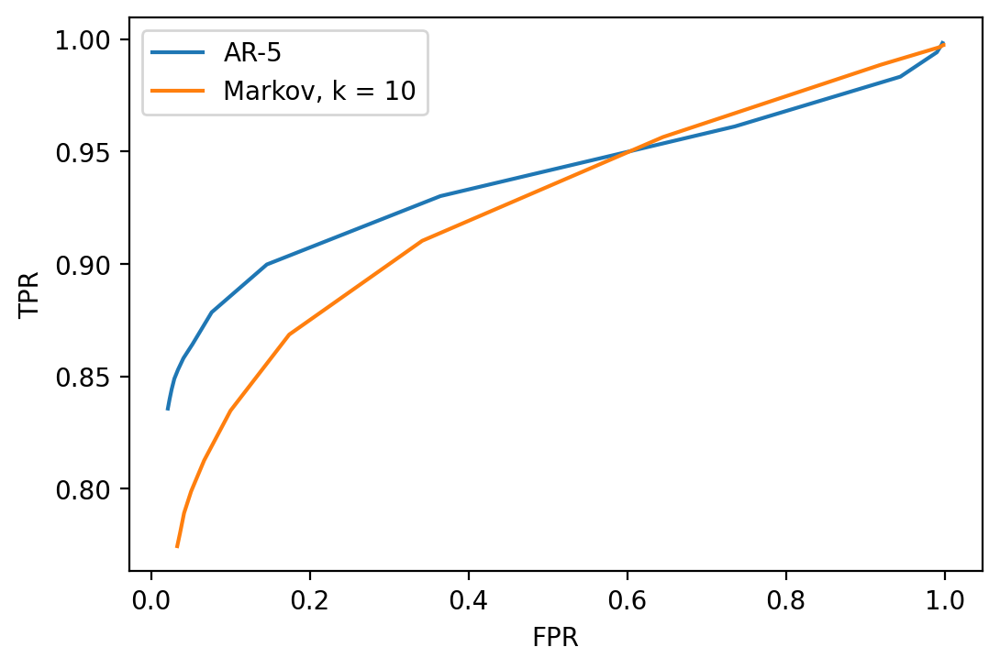

In [64]:
# fpr2_markov_noshift = copy.copy(fpr2_markov)
# tpr2_markov_noshift = copy.copy(tpr2_markov)
plt.plot(fpr2,tpr2,label='AR-5')
plt.plot(fpr2_markov,tpr2_markov,label='Markov, k = 10')
#plt.plot(fpr2_markov_noshift,tpr2_markov_noshift,label='Markov, k = 10 (no shift)')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
print(tpr2_markov)
print(tpr2)
#plt.xlim([-0.1,0.2])
#plt.ylim([-0.1,1.1])

190
11


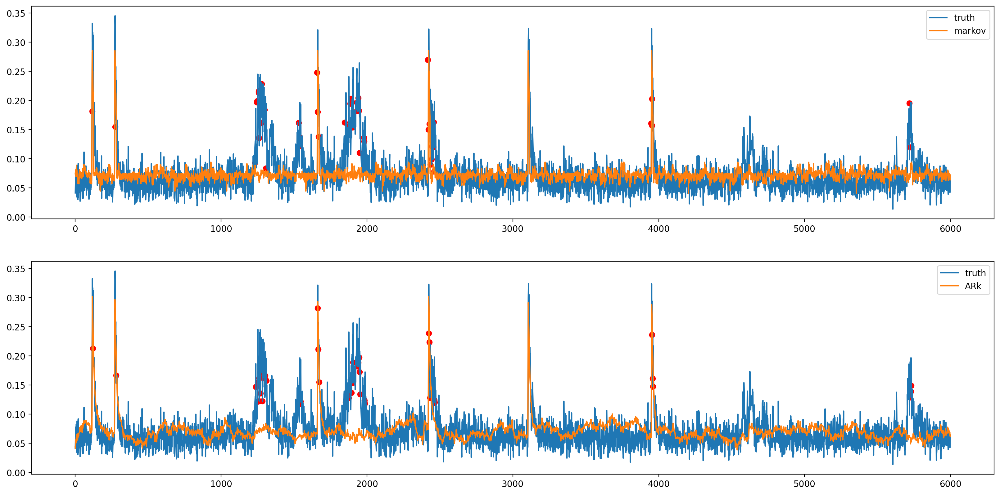

In [67]:
neuron = 53 # 41, 53, 8
T = 6000
T0 = tau

worst_idx = -1
worst_val = -1
vals = []
for neuron in range(x_test_true.shape[1]):
    if np.sum(missed_spikes_markov[neuron]) - np.sum(missed_spikes[neuron]) > worst_val:
        worst_val = np.sum(missed_spikes_markov[neuron]) - np.sum(missed_spikes[neuron])
        worst_idx = neuron
    vals.append(np.sum(missed_spikes_markov[neuron]) - np.sum(missed_spikes[neuron]))

    
idx_sorted = np.argsort(vals)
worst_idx = idx_sorted[-15]
print(worst_idx)
print(vals[worst_idx])

plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(x_test_true[T0:T+T0,worst_idx],label='truth')
plt.plot(x_pred_markov[T0-tau+k:T+T0-tau+k,worst_idx],label='markov')
idx = np.linspace(0,T-1,T)
x_test_true2 = x_test_true[T0:T+T0,:]
plt.scatter(idx[pred_spikes_markov[worst_idx][T0:T+T0]],x_test_true2[pred_spikes_markov[worst_idx][T0-tau:T+T0-tau],worst_idx],color='r')
#plt.plot(x_pred[T0:T+T0,worst_idx],label='ARk')
plt.legend()

plt.subplot(2,1,2)
#plt.plot(u_test_full[k+T0:k+T0+T,neuron],label='input')
plt.plot(x_test_true[T0:T+T0,worst_idx],label='truth')
#plt.plot(x_pred_markov[T0-tau+k:T+T0-tau+k,worst_idx],label='markov')
plt.plot(x_pred[T0:T+T0,worst_idx],label='ARk')
idx = np.linspace(0,T-1,T)
x_test_true2 = x_test_true[T0:T+T0,:]
plt.scatter(idx[pred_spikes[worst_idx][T0:T+T0]],x_test_true2[pred_spikes[worst_idx][T0:T+T0],worst_idx],color='r')
plt.legend()

In [6]:
np.save('AR5_estimate',Ahat)

# Make video

In [146]:
import matplotlib.animation as animation
%matplotlib notebook
plt.rcParams["animation.html"] = "jshtml"
plt.ioff()

x1 = data['x1']
x2 = data['x2']
o1 = data['o1']
o2 = data['o2']
group_ids = data['group_ids']
strial_ids = 2
stim_group_id = group_ids[strial_ids]

T0 = 0
T = 2000 #y_test_0.shape[0]
    
for t in range(T):
    print(t)
    fig, ax = plt.subplots()
    active_x1 = []
    active_x2 = []
    for i in range(u_test_full.shape[1]):
        if u_test_full[t+k,i] > 0:
            active_x1.append(x1[i])
            active_x2.append(x2[i])
    im = plt.subplot(1,2,1)
    im = plt.scatter(x1, x2, s = 30, marker='o', c=x_pred[t,:], cmap='RdPu')
    plt.scatter(active_x1, active_x2, marker='o', s = 70, alpha =1, color = 'green',facecolors='none')
    plt.title('Predicted')
    plt.subplot(1,2,2)
    plt.scatter(x1, x2, s = 30, marker='o', c=x_test_true[t,:], cmap='RdPu')
    plt.scatter(active_x1, active_x2, marker='o', s = 70, alpha =1, color = 'green',facecolors='none')
    plt.title('Truth')
    plt.savefig('./im/im' + str(t) + '.png')
    plt.close()

print('done')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
done


# Analyze inputs

0.0 0.0


<IPython.core.display.Javascript object>


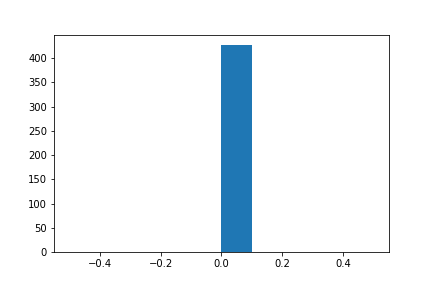

In [173]:
min_dist = []
min_train_idx = []
test_idx = []

start = -10
for t in range(u_test_full.shape[0]):
    if np.sum(np.abs(u_test_full[t,:])) > 0 and t > start + 4:
        dist_t = u_train_full - u_test_full[t,:]
        dist_t = np.sum(np.abs(dist_t), axis=1)
        min_dist.append(np.min(dist_t))
        same_idx = (dist_t == 0)
        idx = np.linspace(0,len(same_idx)-1,len(same_idx)).astype(int)
        min_train_idx.append(idx[same_idx])
        test_idx.append(t)
        start = t

print(np.max(min_dist),np.mean(min_dist))
plt.hist(min_dist)
plt.show()

0.21183324
150


<IPython.core.display.Javascript object>


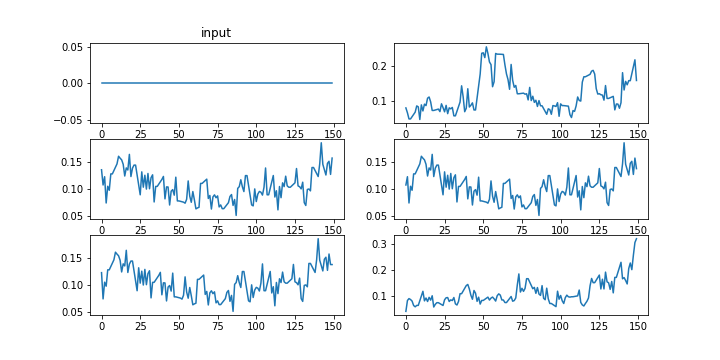

In [214]:
idx = 38
#neuron = np.argmax(u_test_full[test_idx[idx],:])
neuron = -1
for i in range(663):
    if u_test_full[test_idx[idx],i] < 0.1:
        if np.mean(x_test_true[test_idx[idx]-3:test_idx[idx]+3,i]) > 0.2:
            print(np.mean(x_test_true[test_idx[idx]-3:test_idx[idx]+3,i]))
            neuron = i
            break


print(neuron)
total = 6
T0 = test_idx[idx] - 50
T = 150

plt.figure(figsize=(10,5))
plt.subplot(3,2,1)
plt.plot(u_test_full[T0:T+T0,neuron])
plt.title('input')

plt.subplot(3,2,2)
#plt.title('test response')
plt.plot(x_test_true[T0:T+T0,neuron])



for i in range(4):
    plt.subplot(3,2,i+3)
    T0 = np.max([min_train_idx[idx][i] - 50,0])
    plt.plot(y_train_full_interp[T0:T+T0,neuron] / 1000)
    #plt.title('train response ' + str(i+1))
plt.show()

<IPython.core.display.Javascript object>


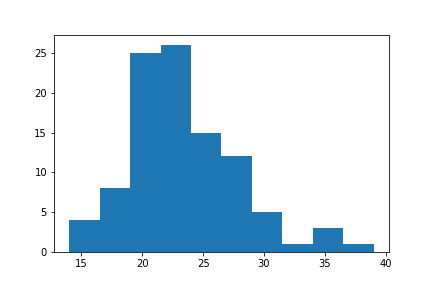

[27, 23, 27, 26, 23, 20, 19, 20, 24, 22, 22, 32, 24, 29, 28, 26, 21, 28, 22, 24, 29, 20, 23, 26, 19, 24, 22, 39, 28, 21, 23, 18, 19, 23, 22, 20, 23, 24, 36, 17, 22, 17, 28, 27, 19, 21, 19, 20, 17, 17, 28, 16, 28, 18, 21, 27, 26, 19, 23, 28, 20, 22, 35, 22, 27, 19, 23, 23, 22, 22, 34, 29, 23, 19, 21, 24, 22, 22, 21, 22, 25, 22, 25, 21, 19, 26, 14, 22, 16, 20, 30, 31, 22, 16, 17, 26, 25, 19, 17, 19]


In [248]:
patterns = []
pattern_count = []
pattern_idx = []
pattern_length = []

start = -10
for t in range(u_session.shape[0]):
    if np.sum(np.abs(u_session[t,:])) > 0 and t > start + 4:
        idx = np.linspace(0,663-1,663).astype(int)
        on = u_session[t,:] > 0
        pattern = np.array(idx[on])
        start = t
        found = False
        for i in range(len(patterns)):
            if len(pattern) == len(patterns[i]):
                if np.linalg.norm(pattern - patterns[i]) == 0:
                    pattern_count[i] += 1
                    pattern_idx[i].append(t)
                    found = True
                    break
        if found is False:
            patterns.append(pattern)
            pattern_count.append(1)
            pattern_idx.append([t])
            pattern_length.append(len(pattern))



neuron_pattern = np.zeros(663)
for i in range(663):
    for p in patterns:
        if i in p:
            neuron_pattern[i] += 1

plt.hist(pattern_count)
plt.show()

print(pattern_count)

118 0.22873508636552503
6


<IPython.core.display.Javascript object>


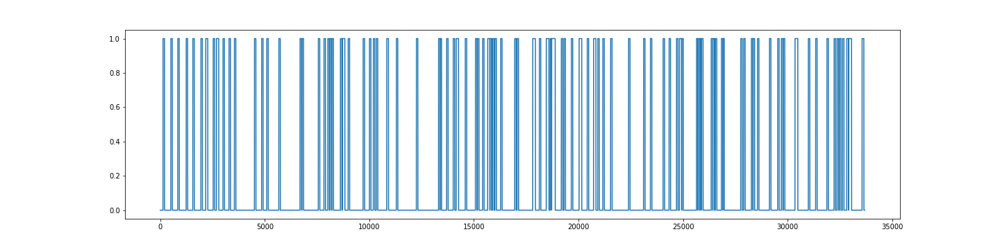

In [259]:
num_neurons = 5
removed_patterns = []
removed_neurons = []
removed_steps = np.zeros(u_session.shape[0])
removed_count = 0

while len(removed_neurons) < num_neurons:
    neuron = np.random.randint(0,663)
    if neuron not in removed_neurons and neuron_pattern[neuron] <= 2:
        removed_neurons.append(neuron)
        for p_idx in range(len(patterns)):
            if neuron in patterns[p_idx] and p_idx not in removed_patterns:
                removed_patterns.append(p_idx)
                removed_count += pattern_count[p_idx]
                for i in pattern_idx[p_idx]:
                    min_idx = np.max([0,i-20])
                    max_idx = np.min([i+50,u_session.shape[0]-1])
                    removed_steps[min_idx:max_idx] = 1
                
print(removed_count, np.sum(removed_steps) / u_session.shape[0])
print(len(removed_patterns))
plt.figure(figsize=(20,5))
plt.plot(removed_steps)
plt.show()